In [1]:
#import necessary libraries
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import xarray as xr
import scipy

import regionmask

# import regionmask

from scipy import stats
from scipy.stats import pearsonr, linregress

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd

import time
from datetime import datetime, date

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.ticker import MaxNLocator, FuncFormatter
import matplotlib.dates as mdates

import shapefile
from mpl_toolkits.axes_grid1 import make_axes_locatable
import warnings
import os

import sys
import os.path
import subprocess
import math
import csv

from netCDF4 import Dataset

#import s3fs
import copy
import json, copy
from pandas import DataFrame
from osgeo import gdal, ogr, osr

In [2]:
csr_scaled = xr.open_dataset(r'scaled_grace_tws_meters_solid_earth_corrected_scaled_usingCLM4_renamed.nc') 
csr_scaled

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [5]:
csr_scaled['lwe_thickness'] = csr_scaled['lwe_thickness'] * 1000
csr_scaled

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB -14.29 -14.31 ... 99.54 99.52

In [6]:
csr_scaled = csr_scaled.rename({"lwe_thickness": "tws"})
csr_scaled

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -14.29 -14.31 -14.32 ... 99.54 99.52

In [8]:
csr_scaled.to_netcdf(r'CSR_VLM_corrected_TWSA_ready2use_mmwe.nc')

In [19]:
CSR_VLM = xr.open_dataset(r'CSR_VLM_corrected_TWSA_ready2use_mmwe.nc')
CSR_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

-------

In [9]:
jpl_scaled = xr.open_dataset(r'JPLscaled_grace_tws_meters_solid_earth_corrected_scaled_usingCLM4_renamed.nc') #SE_corrected_Total_TWS_full_range.nc #Total_SE_corrected_GARCE_feild_without_leakage.nc
jpl_scaled

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [10]:
jpl_scaled['lwe_thickness'] = jpl_scaled['lwe_thickness'] * 1000
jpl_scaled

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB -11.42 -11.43 ... 97.95 97.93

In [11]:
jpl_scaled = jpl_scaled.rename({"lwe_thickness": "tws"})
jpl_scaled

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -11.42 -11.43 -11.45 ... 97.95 97.93

In [12]:
jpl_scaled.to_netcdf(r'jpl_VLM_corrected_TWSA_ready2use_mmwe.nc')

In [18]:
JPL_VLM = xr.open_dataset(r'jpl_VLM_corrected_TWSA_ready2use_mmwe.nc')
JPL_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [30]:
EWA_VLM_meter = xr.open_dataset(r'D:\MSRSGI\Lab Rotation\Physical Geodesy\Python_Workspace\Organaized\Mascon\Combined\Result\Output_Data\Mascon_approach\SH_VCE_EWA_VLM_corrected_TWS.nc')
EWA_VLM_meter

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [31]:
EWA_VLM_meter['lwe_thickness'] = EWA_VLM_meter['lwe_thickness'] * 1000
EWA_VLM_meter

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB -10.9 -10.92 ... 93.67 93.66

In [32]:
EWA_VLM_mmwe = EWA_VLM_meter
EWA_VLM_mmwe

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB -10.9 -10.92 ... 93.67 93.66

In [33]:
EWA_VLM_mmwe.attrs['grid_mapping'] = 'WGS84'
EWA_VLM_mmwe.attrs['standard_name'] = 'Liquid_Water_Equivalent_Thickness'
EWA_VLM_mmwe.attrs['long_name'] = 'Liquid_Water_Equivalent_Thickness'
EWA_VLM_mmwe.attrs['units'] = 'mmwe'
EWA_VLM_mmwe

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB -10.9 -10.92 ... 93.67 93.66
Attributes:
    grid_mapping:   WGS84
    standard_name:  Liquid_Water_Equivalent_Thickness
    long_name:      Liquid_Water_Equivalent_Thickness
    units:          mmwe

In [34]:
EWA_VLM_mmwe = EWA_VLM_mmwe.rename({"lwe_thickness": "tws"})
EWA_VLM_mmwe

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -10.9 -10.92 -10.93 ... 93.67 93.66
Attributes:
    grid_mapping:   WGS84
    standard_name:  Liquid_Water_Equivalent_Thickness
    long_name:      Liquid_Water_Equivalent_Thickness
    units:          mmwe

In [35]:
EWA_VLM = EWA_VLM_mmwe
EWA_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -10.9 -10.92 -10.93 ... 93.67 93.66
Attributes:
    grid_mapping:   WGS84
    standard_name:  Liquid_Water_Equivalent_Thickness
    long_name:      Liquid_Water_Equivalent_Thickness
    units:          mmwe

------

In [13]:
itsg_scaled = xr.open_dataset(r'ITSGscaled_grace_tws_meters_solid_earth_corrected_scaled_usingCLM4_renamed.nc')
itsg_scaled

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [14]:
itsg_scaled['lwe_thickness'] = itsg_scaled['lwe_thickness'] * 1000
itsg_scaled

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB -6.888 -6.901 ... 84.75 84.73

In [15]:
itsg_scaled = itsg_scaled.rename({"lwe_thickness": "tws"})
itsg_scaled

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -6.888 -6.901 -6.915 ... 84.75 84.73

In [16]:
itsg_scaled.to_netcdf(r'itsg_VLM_corrected_TWSA_ready2use_mmwe.nc')

In [17]:
ITSG_VLM = xr.open_dataset(r'itsg_VLM_corrected_TWSA_ready2use_mmwe.nc')
ITSG_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

-----
------

In [23]:
CSR_GIA = xr.open_dataset(r'CSR_total_grace_signal_renamed_scaled_usingCLM4_ohne_GIA2.nc')
CSR_GIA

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [24]:
JPL_GIA = xr.open_dataset(r'JPL_total_grace_signal_renamed_scaled_usingCLM4_ohne_GIA2.nc')
JPL_GIA

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [25]:
ITSG_GIA = xr.open_dataset(r'ITSG_total_grace_signal_renamed_scaled_usingCLM4_ohne_GIA2.nc')
ITSG_GIA

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [29]:
EWA_GIA = xr.open_dataset(r'D:\MSRSGI\Lab Rotation\Physical Geodesy\Python_Workspace\Organaized\Mascon\Combined\Result\Output_Data\Wahr_approach\SH_VCE_EWA_GIA_corrected_TWS_in_mmwe1.nc')
EWA_GIA

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

-----
------

## VLM - GIA

In [28]:
jpl_diff = (JPL_VLM['tws'] - JPL_GIA['tws'])
# Optionally reconstruct DataArray after subtraction:
jpl_diff_xr = xr.DataArray(
    jpl_diff,
    coords=JPL_VLM['tws'].coords,
    dims=JPL_VLM['tws'].dims,
    attrs=JPL_VLM['tws'].attrs
)
jpl_diff_xr

<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[ 28.02711328,  28.02012806,  28.01314776, ...,  28.0480632 ,
          28.04107986,  28.03410006],
        [ 29.67286025,  29.64673191,  29.62063044, ...,  29.75139916,
          29.72519764,  29.69901814],
        [ 30.30120032,  30.24620993,  30.19134964, ...,  30.4668973 ,
          30.41155219,  30.35631999],
        ...,
        [-45.59303013, -45.55555157, -45.5180295 , ..., -45.70516285,
         -45.66783349, -45.63045759],
        [-44.9675071 , -44.94366959, -44.91980893, ..., -45.03883044,
         -45.01508526, -44.99131365],
        [-45.85887994, -45.84988107, -45.84087784, ..., -45.88586048,
         -45.87687157, -45.86787933]],

       [[ 27.6849721 ,  27.67806528,  27.67115955, ...,  27.7056772 ,
          27.69877991,  27.69187664],
        [ 29.31021246,  29.28438537,  29.25858854, ...,  29.38784149,
          29.36194233,  29.33606581],
        [ 29.93176325,  29.87741   ,  29.82318892, ...,  30.09552783,
          30.04082833,  29.98624221],
...
        [ 41.60393639,  41.56465173,  41.52533307, ...,  41.7215428 ,
          41.68238349,  41.64318434],
        [ 41.0255157 ,  41.00067268,  40.97580663, ...,  41.09986974,
          41.07511451,  41.05032782],
        [ 43.21595444,  43.2066489 ,  43.1973464 , ...,  43.24384692,
          43.23455539,  43.22526107]],

       [[-45.19143163, -45.18480833, -45.1781904 , ..., -45.21131921,
         -45.20468742, -45.19805716],
        [-48.03965104, -48.01457533, -47.98954321, ..., -48.11511633,
         -48.08992553, -48.06476736],
        [-48.56147875, -48.50803567, -48.45475318, ..., -48.7227169 ,
         -48.66882965, -48.6150789 ],
        ...,
        [ 42.09290226,  42.05317711,  42.01341566, ...,  42.211825  ,
          42.17222488,  42.13258634],
        [ 41.50756755,  41.48245095,  41.45730147, ...,  41.58276323,
          41.5577278 ,  41.53266246],
        [ 43.7176807 ,  43.70827202,  43.69886638, ...,  43.74588994,
          43.7364916 ,  43.72709614]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31

In [27]:
csr_diff = (CSR_VLM['tws'] - CSR_GIA['tws'])
# Optionally reconstruct DataArray after subtraction:
csr_diff_xr = xr.DataArray(
    csr_diff,
    coords=CSR_VLM['tws'].coords,
    dims=CSR_VLM['tws'].dims,
    attrs=CSR_VLM['tws'].attrs
)
csr_diff_xr

<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[ 22.46239604,  22.45625533,  22.45009789, ...,  22.4806953 ,
          22.4746169 ,  22.46851288],
        [ 24.45885271,  24.43580669,  24.41275541, ...,  24.52796128,
          24.50493332,  24.48189796],
        [ 25.13943964,  25.09049944,  25.04171784, ...,  25.28714206,
          25.23776924,  25.18853323],
        ...,
        [-36.66015856, -36.61419031, -36.56832423, ..., -36.79863466,
         -36.7523741 , -36.70621815],
        [-36.43550753, -36.40443087, -36.37338971, ..., -36.52894324,
         -36.49776008, -36.4666157 ],
        [-37.65971378, -37.64782418, -37.63593845, ..., -37.69543992,
         -37.68351976, -37.67161104]],

       [[ 22.18797246,  22.18190392,  22.17581216, ...,  22.20606506,
          22.20005343,  22.19402307],
        [ 24.15965297,  24.13686675,  24.11407808, ...,  24.22795737,
          24.20520156,  24.18242695],
        [ 24.8327952 ,  24.78442188,  24.73620511, ...,  24.97878072,
          24.92998043,  24.88131803],
...
        [ 32.14080308,  32.0927268 ,  32.04476132, ...,  32.28568649,
          32.23727784,  32.18898568],
        [ 31.97731684,  31.94495124,  31.91263784, ...,  32.07462124,
          32.04214255,  32.0097115 ],
        [ 34.51312749,  34.50081871,  34.48852073, ...,  34.55010696,
          34.53776973,  34.52544323]],

       [[-39.28237046, -39.27660511, -39.2708277 , ..., -39.29956877,
         -39.29385094, -39.28812116],
        [-42.50408842, -42.48214973, -42.46021958, ..., -42.56994245,
         -42.54798622, -42.52603633],
        [-43.08423874, -43.03697009, -42.98989116, ..., -43.22711372,
         -43.17931771, -43.13169215],
        ...,
        [ 32.52421593,  32.47559241,  32.42709615, ...,  32.67072145,
          32.62177344,  32.57293548],
        [ 32.35849489,  32.32577293,  32.29309216, ...,  32.4568976 ,
          32.42405366,  32.39125779],
        [ 34.91787338,  34.90542194,  34.89298522, ...,  34.95526623,
          34.94279365,  34.93032427]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31

In [26]:
itsg_diff = (ITSG_VLM['tws'] - ITSG_GIA['tws'])
# Optionally reconstruct DataArray after subtraction:
itsg_diff_xr = xr.DataArray(
    itsg_diff,
    coords=ITSG_VLM['tws'].coords,
    dims=ITSG_VLM['tws'].dims,
    attrs=ITSG_VLM['tws'].attrs
)
itsg_diff_xr

<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[ 24.057954  ,  24.05296091,  24.04795483, ...,  24.07285453,
          24.06790073,  24.0629356 ],
        [ 25.99633235,  25.97752633,  25.95872249, ...,  26.05275651,
          26.03395137,  26.01514404],
        [ 26.77513963,  26.7345381 ,  26.69407145, ...,  26.89767093,
          26.85671088,  26.81586535],
        ...,
        [-38.03769758, -38.00022545, -37.96292236, ..., -38.15115747,
         -38.11316131, -38.0753421 ],
        [-39.47884537, -39.45128106, -39.4237457 , ..., -39.56174293,
         -39.53407213, -39.50644118],
        [-41.56253826, -41.55153277, -41.54052674, ..., -41.59557047,
         -41.5845585 , -41.57354867]],

       [[ 23.76147288,  23.75653529,  23.75158483, ...,  23.77620489,
          23.77130712,  23.76639721],
        [ 25.67574777,  25.65715374,  25.63856177, ...,  25.73152694,
          25.71293637,  25.69434166],
        [ 26.44588825,  26.4057551 ,  26.36575272, ...,  26.56700691,
          26.52652048,  26.48614536],
...
        [ 33.40179221,  33.36245855,  33.32331544, ...,  33.5209319 ,
          33.48102575,  33.44131355],
        [ 34.98093652,  34.95217758,  34.92345535, ...,  35.06745179,
          35.03857639,  35.00973609],
        [ 38.41637538,  38.40497309,  38.39356788, ...,  38.45061118,
          38.43919822,  38.42778632]],

       [[-41.42409473, -41.41952288, -41.41494181, ..., -41.43774596,
         -41.43320493, -41.42865489],
        [-44.58943033, -44.57191585, -44.55441642, ..., -44.64204554,
         -44.62449675, -44.60695734],
        [-45.2787457 , -45.240188  , -45.20179204, ..., -45.3953174 ,
         -45.35631441, -45.31745424],
        ...,
        [ 33.80033811,  33.76056671,  33.72098543, ...,  33.92081557,
          33.88046217,  33.84030282],
        [ 35.39681542,  35.36773461,  35.33868728, ...,  35.48430431,
          35.45510152,  35.42593527],
        [ 38.86591461,  38.85437548,  38.84284893, ...,  38.90053722,
          38.88899078,  38.8774512 ]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31

In [38]:
ewa_diff = (EWA_VLM['tws'] - EWA_GIA['tws'])
# Optionally reconstruct DataArray after subtraction:
ewa_diff_xr = xr.DataArray(
    ewa_diff,
    coords=EWA_VLM['tws'].coords,
    dims=EWA_VLM['tws'].dims,
    attrs=EWA_VLM['tws'].attrs
)
ewa_diff_xr

<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[ 24.31039611,  24.3045101 ,  24.29861354, ...,  24.32797356,
          24.32212796,  24.31626844],
        [ 26.20794041,  26.18588185,  26.16382838, ...,  26.2741436 ,
          26.25207489,  26.2300078 ],
        [ 26.91175462,  26.86482472,  26.81804039, ...,  27.05334746,
          27.00602289,  26.95882391],
        ...,
        [-39.14813055, -39.10705679, -39.06607851, ..., -39.27190834,
         -39.23055232, -39.18929481],
        [-39.45832517, -39.43007905, -39.4018525 , ..., -39.54317851,
         -39.5148714 , -39.48658849],
        [-40.92823935, -40.91729216, -40.90634515, ..., -40.96110522,
         -40.95014603, -40.93919134]],

       [[ 24.04559048,  24.03973026,  24.03385578, ...,  24.06309042,
          24.05727092,  24.05143776],
        [ 25.92360818,  25.90167268,  25.87974329, ...,  25.98942202,
          25.96748531,  25.94554404],
        [ 26.62202372,  26.57543689,  26.52899207, ...,  26.76256325,
          26.71559289,  26.66874581],
...
        [ 34.46595708,  34.42299003,  34.38013083, ...,  34.59549001,
          34.55220417,  34.50902853],
        [ 34.86172773,  34.83230235,  34.80290659, ...,  34.95013691,
          34.92064227,  34.89117296],
        [ 37.6564691 ,  37.64513441,  37.63380364, ...,  37.69049978,
          37.67915286,  37.66780998]],

       [[-41.35024997, -41.34477932, -41.33930158, ..., -41.36660226,
         -41.36116045, -41.35571082],
        [-44.46897103, -44.44811035, -44.42726858, ..., -44.53164906,
         -44.51074242, -44.48984929],
        [-45.07798889, -45.03280306, -44.98779109, ..., -45.21452279,
         -45.16885541, -45.12334178],
        ...,
        [ 34.97084526,  34.92730985,  34.8838901 , ...,  35.10209274,
          35.05823339,  35.01448355],
        [ 35.37346828,  35.34366194,  35.31387818, ...,  35.46304481,
          35.43315962,  35.40330161],
        [ 38.19825522,  38.18676886,  38.17529392, ...,  38.23272887,
          38.22123317,  38.20974197]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31

-------
--------

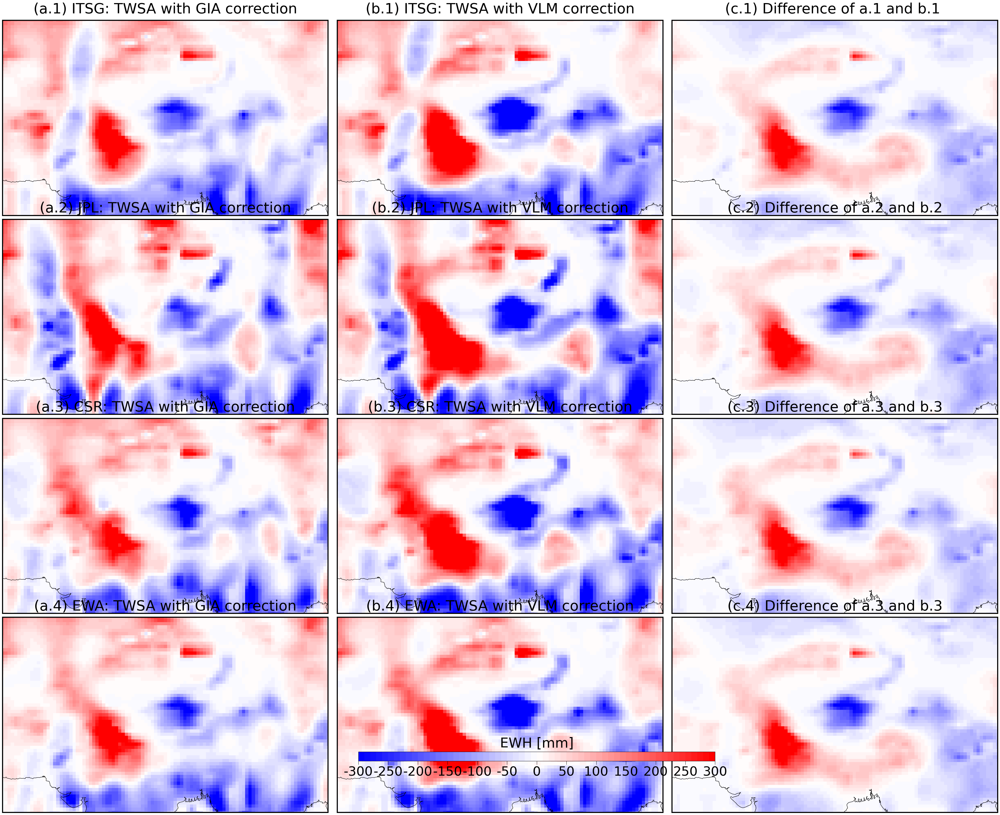

In [58]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.ticker import FuncFormatter
import matplotlib.colors as colors
import matplotlib.ticker as mticker

# Correct and monotonic irregular levels
levels = [
     -300, -290, -280, -270, -260,
    -250, -240, -230, -220, -210, -200, -190, -180, -170, -160, -150, -140, -130, -120,
    -110, -100, -90, -80, -70, -60, -50, -40, -30, -20, -10, 0,
    10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
    160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270,
    280, 290, 300
]

# Create BoundaryNorm
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256, clip=True)

datasets = [
    (ITSG_GIA['tws'].isel(time=0), '(a.1) ITSG: TWSA with GIA correction'),
    (ITSG_VLM['tws'].isel(time=0), '(b.1) ITSG: TWSA with VLM correction'),
    (itsg_diff_xr.isel(time=0), '(c.1) Difference of a.1 and b.1 '),
    
    (JPL_GIA['tws'].isel(time=0), '(a.2) JPL: TWSA with GIA correction'),
    (JPL_VLM['tws'].isel(time=0), '(b.2) JPL: TWSA with VLM correction'),
    (jpl_diff_xr.isel(time=0), '(c.2) Difference of a.2 and b.2'),
    
    (CSR_GIA['tws'].isel(time=0), '(a.3) CSR: TWSA with GIA correction'),
    (CSR_VLM['tws'].isel(time=0), '(b.3) CSR: TWSA with VLM correction'),
    (csr_diff_xr.isel(time=0), '(c.3) Difference of a.3 and b.3'),

    (EWA_GIA['tws'].isel(time=0), '(a.4) EWA: TWSA with GIA correction'),
    (EWA_VLM['tws'].isel(time=0), '(b.4) EWA: TWSA with VLM correction'),
    (ewa_diff_xr.isel(time=0), '(c.4) Difference of a.3 and b.3'),

    
]

fig, axes_2d = plt.subplots(nrows=4, ncols=3, figsize=(50, 40), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes_2d.flatten()

for ax, (da, title) in zip(axes, datasets):
    ax.set_extent([60, 110, 20, 50], crs=ccrs.PlateCarree())
    im = da.plot.imshow(
        ax=ax,
        cmap="bwr",
        norm=norm,
        vmin=levels[0],
        vmax=levels[-1],
        transform=ccrs.PlateCarree(),
        add_colorbar=False,
        rasterized=True
    )
    for spine in ax.spines.values():
        spine.set_linewidth(3)
        spine.set_edgecolor('black')
        
    
    ax.coastlines()
    # Set dataset name as the subplot title
    ax.set_title(title, fontsize=40, fontweight='normal', pad=20)


    # ax.text(
    # 0.12, 0.5, title,
    # transform=ax.transAxes,
    # fontsize=30,
    # fontweight='bold',
    # ha='center',
    # va='top',
    # bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.3'))

# Define major ticks every 50 units
major_ticks = [v for v in levels if v % 50 == 0]

# Get horizontal extent spanning the first and last column subplots in bottom row
bottom_row = axes_2d[-1, :] 
left = (bottom_row[0].get_position().x0) + 0.275
right = (bottom_row[1].get_position().x1) 
width = (right - left)*1.25

# Position the colorbar just below the bottom row, with some vertical padding
bottom = min(ax.get_position().y0 for ax in bottom_row) + 0.05
height = 0.009  # colorbar thickness

# Create an axes for the colorbar at calculated position
cbar_ax = fig.add_axes([left, bottom, width, height])

cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', boundaries=levels, norm=norm, ticks=major_ticks)
cbar.ax.set_xlabel("EWH [mm]", fontsize=38, weight='normal', labelpad=12)
cbar.ax.tick_params(labelsize=36, length=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}"))

cbar.minorticks_off()

plt.subplots_adjust(wspace=0.02, hspace=0.02)
#plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Processed Data/Illustration_of_GF_without_SE_correction.png', dpi=300, bbox_inches='tight')
plt.show()

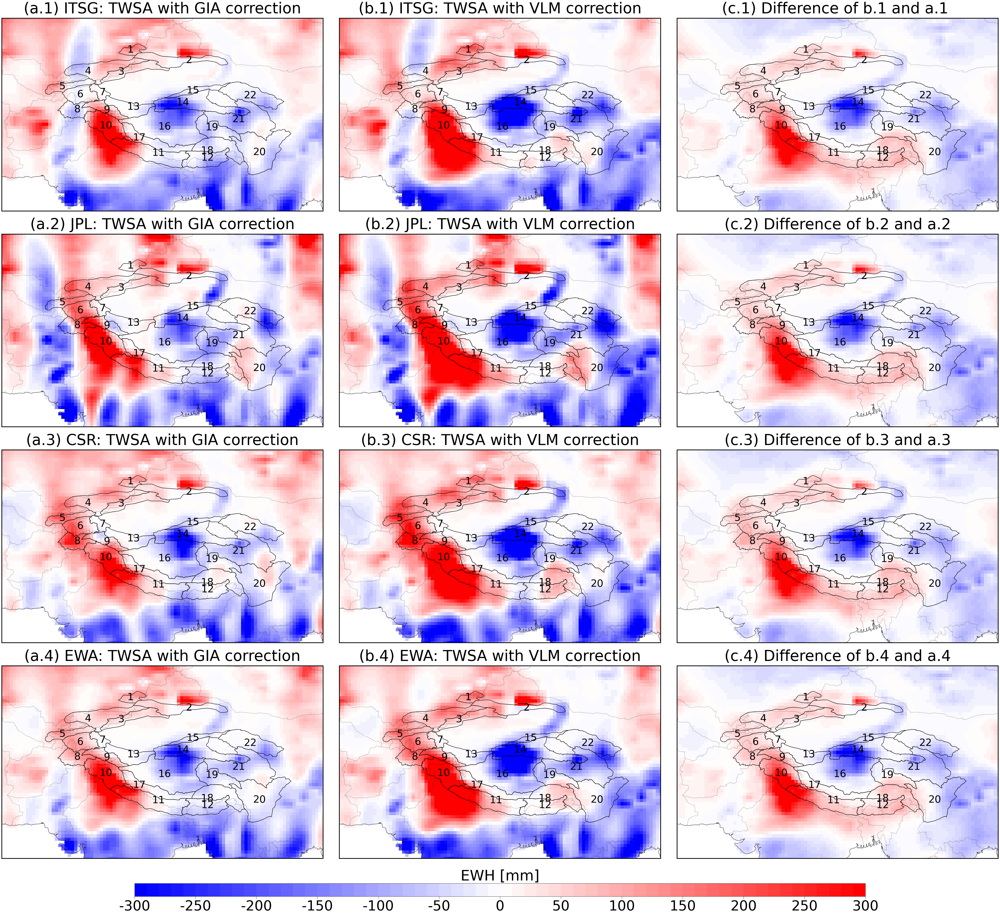

In [92]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.ticker import FuncFormatter
import matplotlib.colors as colors
import numpy as np
import geopandas as gpd

# Read HMA shapefile and project to EPSG:4326
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# Levels for color normalization
levels = [
     -300, -290, -280, -270, -260,
    -250, -240, -230, -220, -210, -200, -190, -180, -170, -160, -150, -140, -130, -120,
    -110, -100, -90, -80, -70, -60, -50, -40, -30, -20, -10, 0,
    10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
    160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270,
    280, 290, 300
]

norm = colors.BoundaryNorm(boundaries=levels, ncolors=256, clip=True)

datasets = [
    (ITSG_GIA['tws'].isel(time=0).where(corrected_ds_jpl == 1), '(a.1) ITSG: TWSA with GIA correction'),
    (ITSG_VLM['tws'].isel(time=0).where(corrected_ds_jpl == 1), '(b.1) ITSG: TWSA with VLM correction'),
    (itsg_diff_xr.isel(time=0).where(corrected_ds_jpl == 1), '(c.1) Difference of b.1 and a.1 '),
    
    (JPL_GIA['tws'].isel(time=0).where(corrected_ds_jpl == 1), '(a.2) JPL: TWSA with GIA correction'),
    (JPL_VLM['tws'].isel(time=0).where(corrected_ds_jpl == 1), '(b.2) JPL: TWSA with VLM correction'),
    (jpl_diff_xr.isel(time=0).where(corrected_ds_jpl == 1), '(c.2) Difference of b.2 and a.2'),
    
    (CSR_GIA['tws'].isel(time=0).where(corrected_ds_jpl == 1), '(a.3) CSR: TWSA with GIA correction'),
    (CSR_VLM['tws'].isel(time=0).where(corrected_ds_jpl == 1), '(b.3) CSR: TWSA with VLM correction'),
    (csr_diff_xr.isel(time=0).where(corrected_ds_jpl == 1), '(c.3) Difference of b.3 and a.3'),

    (EWA_GIA['tws'].isel(time=0).where(corrected_ds_jpl == 1), '(a.4) EWA: TWSA with GIA correction'),
    (EWA_VLM['tws'].isel(time=0).where(corrected_ds_jpl == 1), '(b.4) EWA: TWSA with VLM correction'),
    (ewa_diff_xr.isel(time=0).where(corrected_ds_jpl == 1), '(c.4) Difference of b.4 and a.4')
]

fig, axes_2d = plt.subplots(nrows=4, ncols=3, figsize=(75, 60), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes_2d.flatten()

lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

for ax, (da, title) in zip(axes, datasets):
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    im = da.plot.imshow(
        ax=ax,
        cmap="bwr",
        norm=norm,
        vmin=levels[0],
        vmax=levels[-1],
        transform=ccrs.PlateCarree(),
        add_colorbar=False,
        rasterized=True
    )
    for spine in ax.spines.values():
        spine.set_linewidth(3)
        spine.set_edgecolor('black')

    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    
    # Add HMA boundary geometry for each subplot
    for geom in hma_boundary.geometry:
        ax.add_geometries([geom], crs=ccrs.PlateCarree(),
                          edgecolor='black', facecolor='none', linewidth=1.5)
    # Add region number labels
    for idx, row in hma_boundary.iterrows():
        x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
        ax.text(x, y, str(row['Region_No']), fontsize=40,
                ha='center', va='center', transform=ccrs.PlateCarree())
    
    ax.set_title(title, fontsize=60, fontweight='normal', pad=20)

# Define major ticks every 50 units
major_ticks = [v for v in levels if v % 50 == 0]

# Get horizontal extent spanning the first and last column subplots in bottom row
bottom_row = axes_2d[-1, :] 

left = bottom_row[0].get_position().x0
right = bottom_row[-1].get_position().x1 
width = (right - left)

# Calculate new width and left edge for centered colorbar
new_width = width * 0.7
dleft = (width - new_width) / 2
cbar_ax = fig.add_axes([left + dleft, bottom, new_width, height])

cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', boundaries=levels, norm=norm, ticks=major_ticks)
cbar.ax.set_xlabel("EWH [mm]", fontsize=58, weight='normal', labelpad=12)
cbar.ax.tick_params(labelsize=55, length=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}"))
cbar.minorticks_off()

plt.subplots_adjust(wspace=-0.1, hspace=0.12)
plt.subplots_adjust(bottom=bottom + 0.035)

plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Processed Data/GRACE_3DC_GIA_VLM_difference_TWSA.png', dpi=300, bbox_inches='tight')
plt.show()

In [42]:
jpl_halfdegree_gms = xr.open_dataset(r'GRCTellus.JPL.200204_202408.GLO.RL06.3M.MSCNv04CRI.nc')
jpl_halfdegree_gms

<xarray.Dataset> Size: 1GB
Dimensions:        (lon: 720, lat: 360, time: 236, bounds: 2)
Coordinates:
  * lon            (lon) float64 6kB 0.25 0.75 1.25 1.75 ... 358.8 359.2 359.8
  * lat            (lat) float64 3kB -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
  * time           (time) datetime64[ns] 2kB 2002-04-17T12:00:00 ... 2024-08-...
Dimensions without coordinates: bounds
Data variables:
    lwe_thickness  (time, lat, lon) float64 489MB ...
    uncertainty    (time, lat, lon) float64 489MB ...
    lat_bounds     (lat, bounds) float64 6kB ...
    lon_bounds     (lon, bounds) float64 12kB ...
    time_bounds    (time, bounds) datetime64[ns] 4kB ...
    land_mask      (lat, lon) float64 2MB ...
    scale_factor   (lat, lon) float64 2MB ...
    mascon_ID      (lat, lon) float64 2MB ...
    GAD            (time, lat, lon) float64 489MB ...
Attributes: (12/53)
    Conventions:                   CF-1.6, ACDD-1.3, ISO 8601
    Metadata_Conventions:          Unidata Dataset Discovery v1.0
    standard_name_vocabulary:      NetCDF Climate and Forecast (CF) Metadata ...
    title:                         JPL GRACE and GRACE-FO MASCON RL06.3Mv04 CRI
    summary:                       Monthly gravity solutions from GRACE and G...
    keywords:                      Solid Earth, Geodetics/Gravity, Gravity, l...
    ...                            ...
    C_30_substitution:             TN-14; Loomis et al., 2019, Geophys. Res. ...
    user_note_1:                   The accelerometer on the GRACE-B spacecraf...
    user_note_2:                   The accelerometer on the GRACE-D spacecraf...
    journal_reference:             Watkins, M. M., D. N. Wiese, D.-N. Yuan, C...
    CRI_filter_journal_reference:  Wiese, D. N., F. W. Landerer, and M. M. Wa...
    date_created:                  2024-11-04T07:11:08Z

In [43]:
jpl_land_mask = jpl_halfdegree_gms.land_mask
jpl_land_mask

<xarray.DataArray 'land_mask' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.25 0.75 1.25 1.75 ... 358.2 358.8 359.2 359.8
  * lat      (lat) float64 3kB -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
Attributes:
    units:          binary
    long_name:      Land_Mask
    standard_name:  Land_Mask
    description:    Land Mask that was used with the CRI filter

In [44]:
# Assume `ds` is your xarray dataset
ds_jpl = jpl_halfdegree_gms.land_mask  # Replace with your actual dataset

# Shift latitude and longitude
shifted_lon = (ds_jpl['lon'] - 0.25) % 360  # Wrap around [0, 360)
shifted_lat = ds_jpl['lat'] - 0.25

# Update the dataset with the corrected coordinates
corrected_ds_jpl = ds_jpl.copy()
corrected_ds_jpl = corrected_ds_jpl.assign_coords(lon=shifted_lon, lat=shifted_lat)

# Sort longitude to ensure proper ordering after the shift
corrected_ds_jpl = corrected_ds_jpl.sortby('lon')

# Display the corrected dataset
corrected_ds_jpl

<xarray.DataArray 'land_mask' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.0 88.5 89.0 89.5
Attributes:
    units:          binary
    long_name:      Land_Mask
    standard_name:  Land_Mask
    description:    Land Mask that was used with the CRI filter

In [45]:
corrected_ds_jpl.values

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(360, 720))

--------

In [ ]:
 (ITSG_GIA['tws'].isel(time=0), '(a.1) ITSG: TWSA with GIA correction'),
    (ITSG_VLM['tws'].isel(time=0), '(b.1) ITSG: TWSA with VLM correction'),
    (itsg_diff_xr.isel(time=0), '(c.1) Difference of a.1 and b.1 '),
    
    (JPL_GIA['tws'].isel(time=0), '(a.2) JPL: TWSA with GIA correction'),
    (JPL_VLM['tws'].isel(time=0), '(b.2) JPL: TWSA with VLM correction'),
    (jpl_diff_xr.isel(time=0), '(c.2) Difference of a.2 and b.2'),
    
    (CSR_GIA['tws'].isel(time=0), '(a.3) CSR: TWSA with GIA correction'),
    (CSR_VLM['tws'].isel(time=0), '(b.3) CSR: TWSA with VLM correction'),
    (csr_diff_xr.isel(time=0), '(c.3) Difference of a.3 and b.3'),

    (EWA_GIA['tws'].isel(time=0), '(a.4) EWA: TWSA with GIA correction'),
    (EWA_VLM['tws'].isel(time=0), '(b.4) EWA: TWSA with VLM correction'),
    (ewa_diff_xr.isel(time=0), '(c.4) Difference of a.3 and b.3'),

In [93]:
ITSG_GIA

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

-----

In [94]:
ITSG_GIA['tws'] = ITSG_GIA['tws'] * 0.001
ITSG_GIA

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -0.03095 -0.03095 ... 0.04585

In [95]:
ITSG_GIA.to_netcdf('ITSG_GIA_corrected_TWSA_ready2use.nc_in_meter.nc')

------

In [96]:
JPL_GIA['tws'] = JPL_GIA['tws'] * 0.001
JPL_GIA

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -0.03945 -0.03945 ... 0.05421 0.0542

In [97]:
JPL_GIA.to_netcdf('JPL_GIA_corrected_TWSA_ready2use.nc_in_meter.nc')

------

In [98]:
CSR_GIA['tws'] = CSR_GIA['tws'] * 0.001
CSR_GIA

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -0.03675 -0.03676 ... 0.06459

In [99]:
CSR_GIA.to_netcdf('CSR_GIA_corrected_TWSA_ready2use.nc_in_meter.nc')

-----

In [109]:
EWA_GIA['tws'] = EWA_GIA['tws'] * 0.001
EWA_GIA

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -0.03521 -0.03522 ... 0.05545

In [110]:
EWA_GIA.to_netcdf('EWA_GIA_corrected_TWSA_ready2use.nc_in_meter.nc')

----
------

In [100]:
ITSG_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [101]:
ITSG_VLM['tws'] = ITSG_VLM['tws'] * 0.001
ITSG_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -0.006888 -0.006901 ... 0.08473

In [102]:
ITSG_VLM.to_netcdf('ITSG_VLM_corrected_TWSA_ready2use.nc_in_meter.nc')

------

In [103]:
JPL_VLM['tws'] = JPL_VLM['tws'] * 0.001
JPL_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -0.01142 -0.01143 ... 0.09793

In [104]:
JPL_VLM.to_netcdf('JPL_VLM_corrected_TWSA_ready2use.nc_in_meter.nc')

------

In [105]:
CSR_VLM['tws'] = CSR_VLM['tws'] * 0.001
CSR_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -0.01429 -0.01431 ... 0.09952

In [106]:
CSR_VLM.to_netcdf('CSR_VLM_corrected_TWSA_ready2use.nc_in_meter.nc')

------

In [107]:
EWA_VLM['tws'] = EWA_VLM['tws'] * 0.001
EWA_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -0.0109 -0.01092 ... 0.09367 0.09366
Attributes:
    grid_mapping:   WGS84
    standard_name:  Liquid_Water_Equivalent_Thickness
    long_name:      Liquid_Water_Equivalent_Thickness
    units:          mmwe

In [108]:
EWA_VLM.to_netcdf('EWA_VLM_corrected_TWSA_ready2use.nc_in_meter.nc')

------
-------

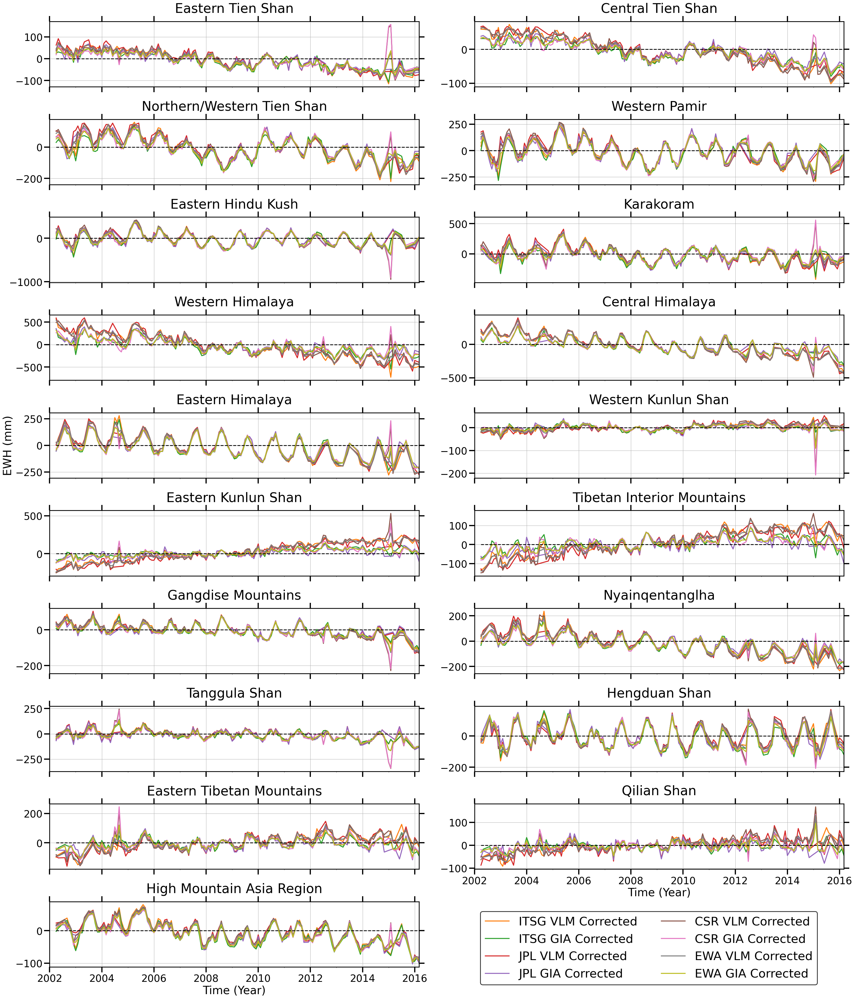

In [116]:
# Define datasets
datasets = {
    # "No Gaussian Filtering": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Wahr_approach/HMA_regional_averaged_no_GF_applied_time_series_GRACE_signal_region_sorted.csv",
    "ITSG VLM Corrected": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Wahr_approach/ITSG_SECorerected_RA_sol_scaled_region_sorted.csv",
    "ITSG GIA Corrected": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Mascon_approach/GIACorerected_Regional_averaged_solutions_from_ITSG_SH_sorted.csv",
    
    "JPL VLM Corrected": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Wahr_approach/JPL_SECorerected_RA_sol_scaled_region_sorted.csv",
    "JPL GIA Corrected": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Mascon_approach/GIACorerected_Regional_averaged_solutions_from_JPL_SH_sorted.csv",
    
    "CSR VLM Corrected": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Mascon_approach/SECorerected_Regional_averaged_solutions_scaled_usingCLM4_renamed_region_sorted.csv",
    "CSR GIA Corrected": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Mascon_approach/GIACorerected_Regional_averaged_solutions_scaled_usingCLM4_renamed_region_sorted1.csv",
    
    "EWA VLM Corrected": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Wahr_approach/SH_EWA_SECorerected_RA_sol_scaled_region_sorted.csv",
    "EWA GIA Corrected": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Wahr_approach/CSR_SH_EWA_GIACorerected_RA_sol_scaled_region_sorted1.csv"

}

dataset_colors = {
    # "No Gaussian Filtering": "#1f77b4",       # Blue
    "ITSG VLM Corrected": "#ff7f0e",    # Orange
    "ITSG GIA Corrected": "#2ca02c",    # Green
    
    "JPL VLM Corrected": "#d62728",    # Red
    "JPL GIA Corrected": "#9467bd",    # Purple
    
    "CSR VLM Corrected": "#8c564b",    # Brown
    "CSR GIA Corrected": "#e377c2",    # Pink
    
    "EWA VLM Corrected": "#7f7f7f",    # Gray
    "EWA GIA Corrected": "#bcbd22"    # Olive
}


# Load region metadata
region_metadata = pd.DataFrame({
    'region': [
        'Eastern Hindu Kush', 'Western Himalaya', 'Eastern Himalaya', 'Central Himalaya', 'Karakoram',
        'Western Pamir', 'Northern/Western Tien Shan', 'Western Kunlun Shan', 'Nyainqentanglha', 'Gangdise Mountains', 'Hengduan Shan',
        'Tibetan Interior Mountains', 'Tanggula Shan', 'Eastern Tibetan Mountains', 'Qilian Shan', 'Eastern Kunlun Shan',
        'Eastern Tien Shan', 'Central Tien Shan', 'High Mountain Asia Region'
    ],
    'region_id': [8, 10, 12, 11, 9, 6, 4, 13, 18, 17, 20, 16, 19, 21, 22, 14, 2, 3, 23]
})
region_metadata_sorted = region_metadata.sort_values(by='region_id')
sorted_regions = region_metadata_sorted['region'].values

# Load and preprocess all datasets
dfs = {}
for name, file in datasets.items():
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    dfs[name] = df[sorted_regions]  # Ensure consistent region order

# # Create colormap for datasets
# colors = plt.cm.tab10(np.linspace(0, 1, len(datasets)))

# Setup figure
fig, axes = plt.subplots(10, 2, figsize=(30, 36), sharex=True, sharey=False)
axes = axes.flatten()

# Generate x-ticks
time_index = dfs[list(datasets.keys())[0]].index
start_year = time_index.min().year
end_year = time_index.max().year
x_ticks = pd.date_range(start=f'{start_year}', end=f'{end_year}', freq='2YS')

# Plot each region with all datasets
for i, (_, row) in enumerate(region_metadata_sorted.iterrows()):
    region = row['region']
    region_id = row['region_id']
    ax = axes[i]
    
    # # Plot each dataset for current region
    # for j, (name, df) in enumerate(dfs.items()):
    #     df[region].plot(ax=ax, color=colors[j], label=name, linewidth=2)

    for name, df in dfs.items():
        df[region].plot(
            ax=ax,
            color=dataset_colors[name],
            label=name,
            linewidth=2.5
        )
    
    # ax.set_title(region, fontsize=22)
    ax.set_title(region, fontsize=33, pad=22)
    ax.grid(True)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([tick.year for tick in x_ticks], rotation=0)
    
    # ax.tick_params(axis='x', labelsize=22, direction='out', top=True, bottom=True, length=7.5, width=0.8)
    # ax.tick_params(axis='y', labelsize=22, direction='out', left=True, right=True, length=7.5, width=0.8)
    ax.tick_params(axis='x', labelsize=25, direction='out', top=True, bottom=True, length=14, width=3)
    ax.tick_params(axis='y', labelsize=25, direction='out', left=True, right=True, length=14, width=3)
    
    
    ax.hlines(0, time_index.min(), time_index.max(), colors='k', linestyles='--', linewidth=2)
    
    # # Add region ID
    # ax.text(0.95, 0.95, f"{region_id}", transform=ax.transAxes,
    #         fontsize=16, fontweight='bold', verticalalignment='top', horizontalalignment='left',
    #         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round, pad=0.2', linewidth=1))

for ax in axes:   #setting rectangular box for each subplot, adjusting the width of the edge of the box
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

# Add labels and legend
axes[8].set_ylabel('EWH (mm)', fontsize=28)

axes[17].set_xlabel('Time (Year)', fontsize=28)

axes[18].set_xlabel('Time (Year)', fontsize=28)

# Make sure x-tick labels are visible on bottom row axes
axes[17].tick_params(labelbottom=True)

axes[17].xaxis.get_label().set_visible(True)

# === LEGEND PLACEMENT ===
legend = axes[18].legend(
    list(datasets.keys()),
    loc='center left',
    bbox_to_anchor=(1.15, 0.29),  # Adjust horizontal position as needed
    ncol=2,
    fontsize=30,
    frameon=True
)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(2)     

axes[18].tick_params(labelbottom=True)


# fig.legend(list(datasets.keys()), loc='lower center', 
#            bbox_to_anchor=(0.52, -0.03), ncol=5, fontsize=30)

# Remove unused subplots
for j in range(len(df.columns), len(axes)):
    fig.delaxes(axes[j])

# Final adjustments
plt.tight_layout()
plt.subplots_adjust(top=0.95, wspace=0.15)
plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Figures/Thesis_TimeSeries/Approaches/Wahr_approach/GDC_with_VLM_GIA_corrected_TWSA_timeseries_no_sharey_withoutEnvelope.png', dpi=300, bbox_inches='tight')
plt.show()